# Nuage de mots à partir des titres des oeuvres exposées

In [1]:
#Localiser le répertoire de travail 

import os
os.getcwd()

'/Users/frederinepradier/GitHub/Scripts/scripts'

In [2]:
#Import des librairies

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from collections import Counter
import matplotlib.ticker as ticker

In [3]:
#Designation du fichier de travail (tableur tsv)

path = "../data/PCP_complete_title.tsv" 

In [4]:
#Création d'un dataframe

df = pd.read_csv(path, sep="\t")

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5050 entries, 0 to 5049
Data columns (total 24 columns):
 #   Column                                                          Non-Null Count  Dtype  
---  ------                                                          --------------  -----  
 0   File                                                            5050 non-null   object 
 1   Exhibition_Date                                                 5050 non-null   int64  
 2   First name Last name                                            5050 non-null   object 
 3   Last name of the artist                                         5050 non-null   object 
 4   First name of the artist                                        4825 non-null   object 
 5   Sex of the artist (F/M/FM/empty)                                5050 non-null   object 
 6   Membership in movement, if applicable                           2411 non-null   object 
 7   Biographical elements                              

In [6]:
#Comptage des titres

counts = df['Title of artwork'].value_counts()
counts

Étude                           122
Portrait                         86
Paysage                          21
 Étude                           21
Crépuscule                       18
                               ... 
Rêveuse                           1
Un Modèle                         1
La Chanson des Ramoneurs          1
Prière                            1
En descendant de la colline       1
Name: Title of artwork, Length: 4211, dtype: int64

In [7]:
#Titres les plus fréquents

counts.index = counts.index.map(str)
print(counts.index)
nb = str(len(df))
print(nb)

Index(['Étude ', 'Portrait ', 'Paysage ', ' Étude ', 'Crépuscule ', 'Étude  ',
       'Profil ', ' Portrait ', 'Marine ', 'Rêverie ',
       ...
       'La Forteresse  ', 'En pâture  ', 'Sale temps  ',
       'Coucher de soleil sur la Meuse  ', 'Printemps  ', 'Rêveuse  ',
       'Un Modèle  ', 'La Chanson des Ramoneurs  ', 'Prière  ',
       'En descendant de la colline '],
      dtype='object', length=4211)
5050


In [8]:
#Téléchargement de la librairie nécessaire pour le nuage de mot

!pip install wordcloud 
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image

You should consider upgrading via the '/Library/Frameworks/Python.framework/Versions/3.9/bin/python3.9 -m pip install --upgrade pip' command.


In [9]:
x, y = np.ogrid[:300, :300]

mask = (x - 150) ** 2 + (y - 150) ** 2 > 130 ** 2
mask = 255 * mask.astype(int)

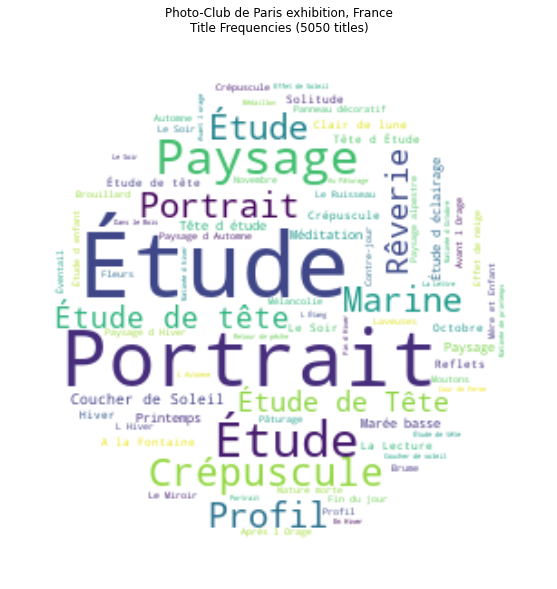

In [10]:
#Création d'un nuage de mots avec les titres

wordcloud = WordCloud(background_color="white", 
                      mask = mask, collocations=True).generate_from_frequencies(counts)
plt.figure(figsize=(20,10))
plt.title('Photo-Club de Paris exhibition, France' +'\n'+'Title Frequencies (' + nb + ' titles)')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [11]:
#Création d'une fonction pour éliminer les stopwords, réaliser un nuage de mots, et l'enregistrer

def fix_my_stuff(x):
    x = x.tolist()
    x = '; '.join([str(y) for y in x])
    return(x)

def word_clouding(data):
    data = data
    text = df[data].agg(lambda x: fix_my_stuff(x)) 
    text = text.lower()
    stopwords=[ 'et', 'du', 'le','la','les', 'un', 'une', 'des', 'à', 'dans', 
               'pour', 'avec', 'par', 'que', 'qui', 
               'il','elle', 'ils', 'nous', 'vous', 'ils', 
               "d'un", 'de', 'm', 'a','au','en', 'dans', 'sur', 'aux',
               "d'", "d'une", "nan", "Mme", "M", "Mle", "Mlle", 
               "The", "the", "of", "in", "at", "on", "and",
              "from", "to", "d", "l"]
    wordcloud = WordCloud(background_color="white",
                      mask = mask, stopwords = stopwords, collocations=True).generate(text)
    plt.figure(figsize=(60,30), dpi=400)
    plt.title("Photo-Club de Paris"+ title + "\n"+" (Normal stopwords)")
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()
    wordcloud.to_file('wordcloud.png')

In [12]:
#Générer le nuage de mots

title = 'Words in Titles'
data = 'Title of artwork'
word_clouding(data)
